In [2]:
import json
import time
from datetime import datetime, timedelta
from kafka import KafkaProducer
from uxsim import World, random
from kafka import KafkaConsumer


producer = KafkaProducer(
    bootstrap_servers='localhost:9092',
   value_serializer=lambda v: json.dumps(v).encode('utf-8')
)


seed = None
W = World(
    name="",
    deltan=5,  
    tmax=3600,  
    print_mode=1, save_mode=0, show_mode=1,
    random_seed=seed,
    duo_update_time=600
)
random.seed(seed)


signal_time = 20
sf_1 = 1
sf_2 = 1

I1 = W.addNode("I1", 1, 0, signal=[signal_time*sf_1, signal_time*sf_2])
I2 = W.addNode("I2", 2, 0, signal=[signal_time*sf_1, signal_time*sf_2])
I3 = W.addNode("I3", 3, 0, signal=[signal_time*sf_1, signal_time*sf_2])
I4 = W.addNode("I4", 4, 0, signal=[signal_time*sf_1, signal_time*sf_2])
W1 = W.addNode("W1", 0, 0)
E1 = W.addNode("E1", 5, 0)
N1 = W.addNode("N1", 1, 1)
N2 = W.addNode("N2", 2, 1)
N3 = W.addNode("N3", 3, 1)
N4 = W.addNode("N4", 4, 1)
S1 = W.addNode("S1", 1, -1)
S2 = W.addNode("S2", 2, -1)
S3 = W.addNode("S3", 3, -1)
S4 = W.addNode("S4", 4, -1)
S5 = W.addNode("S5", 5, -1)


W.addLink("W1_to_I1", W1, I1, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I1_to_I2", I1, I2, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I2_to_I3", I2, I3, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I3_to_I4", I3, I4, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I4_to_E1", I4, E1, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)

W.addLink("N1_to_I1", N1, I1, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)
W.addLink("N3_to_I3", N3, I3, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)
W.addLink("I1_to_S1", I1, S1, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)
W.addLink("I3_to_S3", I3, S3, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)
W.addLink("E1_to_S5", E1, S5, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)

W.addLink("S2_to_I2", S2, I2, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=1)
W.addLink("S4_to_I4", S4, I4, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=1)
W.addLink("I2_to_N2", I2, N2, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=1)
W.addLink("I4_to_N4", I4, N4, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=1)
W.addLink("I1_to_N1", I1, N1, length=500, free_flow_speed=30, jam_density=0.2, number_of_lanes=2, signal_group=2)

W.addLink("I4_to_I3", I4, I3, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I3_to_I2", I3, I2, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I2_to_I1", I2, I1, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)
W.addLink("I1_to_W1", I1, W1, length=500, free_flow_speed=50, jam_density=0.2, number_of_lanes=3, signal_group=1)


dt = 30  
fixed_demand = 2  

for t in range(0, 3600, dt):
    W.adddemand(S4, N1, t, t + dt, fixed_demand)
    W.adddemand(W1, E1, t, t + dt, fixed_demand)
    W.adddemand(S2, I2, t, t + dt, fixed_demand / 2)
    W.adddemand(I2, N2, t, t + dt, fixed_demand / 2)



W.exec_simulation()


W.analyzer.print_simple_stats()


simulation setting:
 scenario name: 
 simulation duration:	 3600 s
 number of vehicles:	 21600 veh
 total road length:	 9500 m
 time discret. width:	 5 s
 platoon size:		 5 veh
 number of timesteps:	 720
 number of platoons:	 4320
 number of links:	 19
 number of nodes:	 15
 setup time:		 1.99 s
simulating...
      time| # of vehicles| ave speed| computation time
       0 s|        0 vehs|   0.0 m/s|     0.00 s
     600 s|      245 vehs|  12.2 m/s|     0.99 s
    1200 s|      245 vehs|  12.2 m/s|     1.93 s
    1800 s|      245 vehs|  12.2 m/s|     2.75 s
    2400 s|      245 vehs|  12.2 m/s|     3.45 s
    3000 s|      245 vehs|  12.2 m/s|     4.04 s
    3595 s|      265 vehs|  26.8 m/s|     4.59 s
 simulation finished
results:
 average speed:	 18.3 m/s
 number of completed trips:	 14230 / 21600
 average travel time of trips:	 465.1 s
 average delay of trips:	 429.2 s
 delay ratio:			 0.923


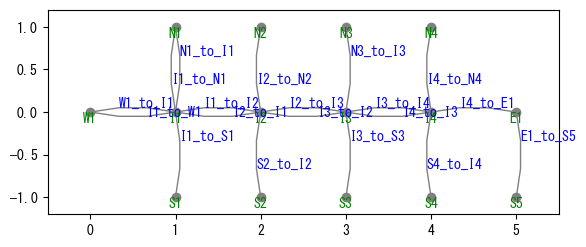

In [3]:
W.show_network()

In [4]:
W.analyzer.basic_to_pandas()

,total_trips,completed_trips,total_travel_time,average_travel_time,total_delay,average_delay
0,21600,14230,6617900.0,465.06676,6107400.0,429.191848


In [5]:
W.analyzer.link_traffic_state_to_pandas().head(20)

,link,t,x,delta_t,delta_x,q,k,v
0,W1_to_I1,0,0,120,250,1.6375,0.071089,23.034413
1,W1_to_I1,0,250,120,250,1.2750,0.081161,15.709571
2,W1_to_I1,120,0,120,250,1.0500,0.127500,8.235294
3,W1_to_I1,120,250,120,250,1.2250,0.113500,10.792952
4,W1_to_I1,240,0,120,250,1.3000,0.113750,11.428571
5,W1_to_I1,240,250,120,250,1.2625,0.107750,11.716937
6,W1_to_I1,360,0,120,250,1.2000,0.121250,9.896907
7,W1_to_I1,360,250,120,250,1.0500,0.121000,8.677686
8,W1_to_I1,480,0,120,250,1.0875,0.124250,8.752515
9,W1_to_I1,480,250,120,250,1.3750,0.106000,12.971698


In [6]:
W.analyzer.od_to_pandas()

,orig,dest,total_trips,completed_trips,free_travel_time,average_travel_time,stddiv_travel_time
0,S4,N1,7200,2825,63.333333,1131.283186,611.63128
1,W1,E1,7200,4245,50.000000,772.396938,408.70230
2,S2,I2,3600,3580,16.666667,20.000000,0.00000
3,I2,N2,3600,3580,16.666667,20.000000,0.00000


In [10]:
W.analyzer.network_anim(detailed=0, network_font_size=1, figsize=(6,6))

NameError: name 'W' is not defined

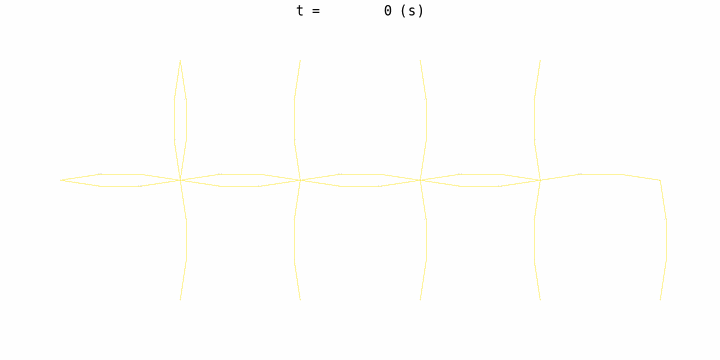

In [7]:
from IPython.display import display, Image
with open("out/anim_network0.gif", "rb") as f:
    display(Image(data=f.read(), format='png'))

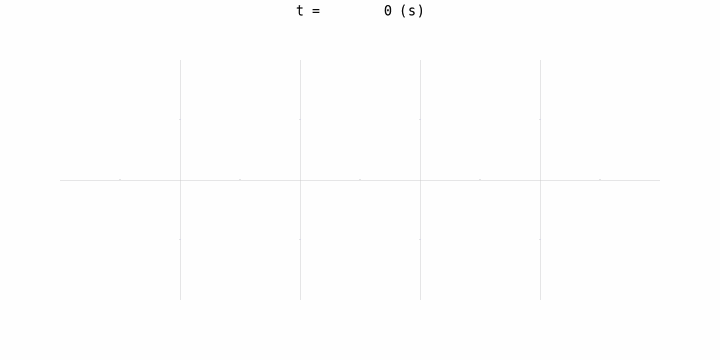

In [9]:
with open("out/anim_network_fancy.gif", "rb") as f:
    display(Image(data=f.read(), format='png'))

In [10]:

df = W.analyzer.link_to_pandas()
df['av_demand'] = (df['traffic_volume']+df['vehicles_remain'])/3600
df['signal_time'] = signal_time
df

,link,traffic_volume,vehicles_remain,free_travel_time,average_travel_time,stddiv_travel_time,av_demand,signal_time
0,W1_to_I1,4320,45,10.000000,58.027778,9.785863,1.212500,20
1,I1_to_I2,4305,15,10.000000,26.715278,12.355084,1.200000,20
2,I2_to_I3,4275,30,10.000000,27.243056,11.583181,1.195833,20
3,I3_to_I4,4260,15,10.000000,26.465278,12.529362,1.187500,20
4,I4_to_E1,4245,15,10.000000,8.472222,2.303212,1.183333,20
5,N1_to_I1,0,0,16.666667,-1.000000,-1.000000,0.000000,20
6,N3_to_I3,0,0,16.666667,-1.000000,-1.000000,0.000000,20
7,I1_to_S1,0,0,16.666667,-1.000000,-1.000000,0.000000,20
8,I3_to_S3,0,0,16.666667,-1.000000,-1.000000,0.000000,20
9,E1_to_S5,0,0,16.666667,-1.000000,-1.000000,0.000000,20


In [11]:
W.analyzer.vehicles_to_pandas().head(20)

,name,dn,orig,dest,t,link,x,s,v
0,0,5,S4,N1,5,S4_to_I4,0.000000,-1.0,30.000000
1,0,5,S4,N1,10,S4_to_I4,150.000000,-1.0,30.000000
2,0,5,S4,N1,15,S4_to_I4,300.000000,-1.0,30.000000
3,0,5,S4,N1,20,S4_to_I4,450.000000,-1.0,30.000000
4,0,5,S4,N1,25,I4_to_I3,166.666667,-1.0,10.000000
5,0,5,S4,N1,30,I4_to_I3,416.666667,-1.0,50.000000
6,0,5,S4,N1,35,I3_to_I2,166.666667,-1.0,16.666667
7,0,5,S4,N1,40,I3_to_I2,416.666667,-1.0,50.000000
8,0,5,S4,N1,45,I2_to_I1,166.666667,-1.0,16.666667
9,0,5,S4,N1,50,I2_to_I1,416.666667,-1.0,50.000000


In [12]:


# Collect vehicle data from analyzer
vehicle_data_df = W.analyzer.vehicles_to_pandas()
# Optionally print the first few rows
print(vehicle_data_df.head(20))

for _, row in vehicle_data_df.iterrows():
   
    if row['link'] != "waiting_at_origin_node":
        
        message = {
            "vehicle_name": row['name'],
            "origin": row['orig'],
            "destination": row['dest'],
            "time": datetime.now().isoformat(),
            "link": row['link'],
            "position": {"x": row['x'], "y": row['s']},  
            "spacing": row['s'],
            "speed": row['v']
        }

        print(message)  

        try:
            producer.send('vehicle_positions', message)
        except Exception as e:
            print(f"Error sending message to Kafka: {e}")

producer.flush()

   name  dn orig dest   t      link           x    s          v
0     0   5   S4   N1   5  S4_to_I4    0.000000 -1.0  30.000000
1     0   5   S4   N1  10  S4_to_I4  150.000000 -1.0  30.000000
2     0   5   S4   N1  15  S4_to_I4  300.000000 -1.0  30.000000
3     0   5   S4   N1  20  S4_to_I4  450.000000 -1.0  30.000000
4     0   5   S4   N1  25  I4_to_I3  166.666667 -1.0  10.000000
5     0   5   S4   N1  30  I4_to_I3  416.666667 -1.0  50.000000
6     0   5   S4   N1  35  I3_to_I2  166.666667 -1.0  16.666667
7     0   5   S4   N1  40  I3_to_I2  416.666667 -1.0  50.000000
8     0   5   S4   N1  45  I2_to_I1  166.666667 -1.0  16.666667
9     0   5   S4   N1  50  I2_to_I1  416.666667 -1.0  50.000000
10    0   5   S4   N1  55  I2_to_I1  500.000000 -1.0  16.666667
11    0   5   S4   N1  60  I2_to_I1  500.000000 -1.0   0.000000
12    0   5   S4   N1  65  I2_to_I1  500.000000 -1.0   0.000000
13    0   5   S4   N1  70  I2_to_I1  500.000000 -1.0   0.000000
14    0   5   S4   N1  75  I1_to_N1  150

In [13]:
consumer = KafkaConsumer(
    'vehicle_positions',  
    bootstrap_servers='localhost:9092',  
    auto_offset_reset='earliest',  
    group_id='vehicle_consumer_group',  
    value_deserializer=lambda m: json.loads(m.decode('utf-8'))  
)

print("Consumer started. Listening for messages...")


try:
    for message in consumer:
        print("Received message:")
        print(message.value)  
        print("---")
except KeyboardInterrupt:
    print("Consumer interrupted.")
finally:
    consumer.close()  

Consumer started. Listening for messages...
Consumer interrupted.
